# Comics Fine-Tuning LLaVA with Scene Predictions (v2 - FIXED)

## 🔧 KEY FIX IN THIS VERSION

**Problem:** Previous version trained on the ENTIRE input (prompt + response), causing the model to learn prompt templates instead of predictions.

**Solution:** This version properly masks the prompt tokens in labels, so the model only learns to predict the scene predictions.

---

This notebook handles **everything** for fine-tuning:

1. **Part A**: Configuration and data preparation
2. **Part B**: Create the fine-tuning script (LoRA) - WITH LABEL MASKING FIX
3. **Part C**: Create the SLURM batch file
4. **Part D**: Submit and monitor training
5. **Part E**: Create evaluation script
6. **Part F**: Run evaluation and calculate metrics
7. **Part G**: Visualize results and compare with zero-shot

---

**You run this notebook from the Delta LOGIN node (no GPU needed).**

---
# PART A: Configuration
---

Set your training parameters here. **Edit these values as needed.**

In [11]:
# =============================================================================
# CONFIGURATION - EDIT THESE!
# =============================================================================

# Paths
PROJECT_DIR = "/scratch/bftl/hsekar/comics_project"
CONDA_ENV_PATH = "/u/hsekar/comics_env"

# Training size options:
#   - "quick":  1,000 examples, 1 epoch  (~30 min)  - for testing
#   - "medium": 10,000 examples, 2 epochs (~2-3 hrs) - recommended for deadline
#   - "full":   all data, 3 epochs (8+ hrs) - best results

TRAINING_SIZE = "medium"  # <-- CHANGE THIS: "quick", "medium", or "full"

# Training configurations based on size
CONFIGS = {
    "quick": {
        "num_train_examples": 1000,
        "num_val_examples": 200,
        "num_epochs": 1,
        "batch_size": 2,
        "gradient_accumulation_steps": 4,
        "time_limit": "04:00:00",
        "description": "Quick test run (~30 min)"
    },
    "medium": {
        "num_train_examples": 10000,
        "num_val_examples": 1000,
        "num_epochs": 1,
        "batch_size": 4,
        "gradient_accumulation_steps": 4,
        "time_limit": "10:00:00",
        "description": "Medium run (~2-3 hours)"
    },
    "full": {
        "num_train_examples": -1,  # -1 means all
        "num_val_examples": 5000,
        "num_epochs": 3,
        "batch_size": 2,
        "gradient_accumulation_steps": 4,
        "time_limit": "12:00:00",
        "description": "Full training (8+ hours)"
    }
}

# Get selected config
config = CONFIGS[TRAINING_SIZE]

NUM_TRAIN_EXAMPLES = config["num_train_examples"]
NUM_VAL_EXAMPLES = config["num_val_examples"]
NUM_EPOCHS = config["num_epochs"]
BATCH_SIZE = config["batch_size"]
GRADIENT_ACCUMULATION_STEPS = config["gradient_accumulation_steps"]
TIME_LIMIT = config["time_limit"]

# Evaluation settings
NUM_TEST_EXAMPLES = 1000  # Same as zero-shot for fair comparison

# LoRA settings (these are good defaults)
LORA_R = 16
LORA_ALPHA = 32
LORA_DROPOUT = 0.05

# Learning rate
LEARNING_RATE = 2e-5

print("="*60)
print(f"TRAINING CONFIGURATION: {TRAINING_SIZE.upper()}")
print("="*60)
print(f"  {config['description']}")
print(f"")
print(f"  Training examples:  {NUM_TRAIN_EXAMPLES if NUM_TRAIN_EXAMPLES > 0 else 'ALL (249,576)'}")
print(f"  Validation examples: {NUM_VAL_EXAMPLES}")
print(f"  Epochs:             {NUM_EPOCHS}")
print(f"  Batch size:         {BATCH_SIZE}")
print(f"  Gradient accum:     {GRADIENT_ACCUMULATION_STEPS}")
print(f"  Effective batch:    {BATCH_SIZE * GRADIENT_ACCUMULATION_STEPS}")
print(f"  Time limit:         {TIME_LIMIT}")
print(f"")
print(f"  LoRA rank:          {LORA_R}")
print(f"  LoRA alpha:         {LORA_ALPHA}")
print(f"  Learning rate:      {LEARNING_RATE}")
print("="*60)

TRAINING CONFIGURATION: MEDIUM
  Medium run (~2-3 hours)

  Training examples:  10000
  Validation examples: 1000
  Epochs:             1
  Batch size:         4
  Gradient accum:     4
  Effective batch:    16
  Time limit:         10:00:00

  LoRA rank:          16
  LoRA alpha:         32
  Learning rate:      2e-05


In [12]:
# =============================================================================
# CREATE DIRECTORIES
# =============================================================================

import os
from pathlib import Path

project_path = Path(PROJECT_DIR)
scripts_dir = project_path / "scripts"
logs_dir = project_path / "logs"
outputs_dir = project_path / "outputs" / "finetuned_pred"
checkpoints_dir = project_path / "checkpoints" / "llava_comics_lora_pred"

scripts_dir.mkdir(parents=True, exist_ok=True)
logs_dir.mkdir(parents=True, exist_ok=True)
outputs_dir.mkdir(parents=True, exist_ok=True)
checkpoints_dir.mkdir(parents=True, exist_ok=True)

print("Directories ready:")
print(f"   Scripts:     {scripts_dir}")
print(f"   Logs:        {logs_dir}")
print(f"   Outputs:     {outputs_dir}")
print(f"   Checkpoints: {checkpoints_dir}")

Directories ready:
   Scripts:     /scratch/bftl/hsekar/comics_project/scripts
   Logs:        /scratch/bftl/hsekar/comics_project/logs
   Outputs:     /scratch/bftl/hsekar/comics_project/outputs/finetuned_pred
   Checkpoints: /scratch/bftl/hsekar/comics_project/checkpoints/llava_comics_lora_pred


---
# PART B: Create Fine-Tuning Script
---

This creates the training script that will run on the GPU node.

Uses **LoRA** for efficient fine-tuning.

In [3]:
# =============================================================================
# PART B - 07_finetune_llava.ipynb (v2 - WITH LABEL MASKING FIX)
# =============================================================================
# This version uses 5 context panels but at 384px to fit in A100 40GB memory
# =============================================================================

# =============================================================================
# CREATE FINE-TUNING SCRIPT (v7 - 5 PANELS @ 384px)
# =============================================================================

finetune_script = f'''\\
#!/usr/bin/env python3
"""
COMICS FINE-TUNING - LLaVA with LoRA (v2 - WITH LABEL MASKING FIX)
============================================================
Fine-tunes LLaVA-OneVision on comic panel prediction task.
Uses 5 context panels at reduced 384px resolution to fit A100 40GB.

Author: Harsha Sekar
Date: December 2025
"""

import os
import json
import pickle
import random
import time
import gc
from datetime import datetime
from pathlib import Path
from typing import List, Dict, Optional

import torch
from torch.utils.data import Dataset
from PIL import Image

from transformers import (
    LlavaOnevisionProcessor,
    LlavaOnevisionForConditionalGeneration,
    TrainingArguments,
    Trainer,
    BitsAndBytesConfig,
)
from peft import LoraConfig, get_peft_model, prepare_model_for_kbit_training

# =============================================================================
# CONFIGURATION
# =============================================================================

PROJECT_DIR = Path("{PROJECT_DIR}")
DATA_DIR = PROJECT_DIR / "data" / "processed"
OUTPUT_DIR = PROJECT_DIR / "checkpoints" / "llava_comics_lora_pred"
MODEL_CACHE = PROJECT_DIR / "model_cache"

OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

MODEL_ID = "llava-hf/llava-onevision-qwen2-7b-ov-hf"

# Training parameters
NUM_TRAIN_EXAMPLES = {NUM_TRAIN_EXAMPLES}
NUM_VAL_EXAMPLES = {NUM_VAL_EXAMPLES}
NUM_EPOCHS = {NUM_EPOCHS}

BATCH_SIZE_PER_GPU = {BATCH_SIZE}
GRADIENT_ACCUMULATION_STEPS = {GRADIENT_ACCUMULATION_STEPS}  # Effective batch = 1 * 2 * 4 = 8
LEARNING_RATE = {LEARNING_RATE}

# LoRA parameters
LORA_R = {LORA_R}
LORA_ALPHA = {LORA_ALPHA}
LORA_DROPOUT = {LORA_DROPOUT}

# KEY CHANGE: 5 panels but at 384px to fit in A100 40GB memory
CONTEXT_PANELS = 5      # Full 5 panels (same as zero-shot)
MAX_IMAGE_SIZE = 672    # Reduced from 672 to fit memory
RANDOM_SEED = 42

# =============================================================================
# DATASET CLASS
# =============================================================================

class ComicsDataset(Dataset):
    """Dataset for comic panel prediction task."""
    
    def __init__(self, sequences: List[Dict], processor, max_samples: int = -1):
        self.processor = processor
        
        self.sequences = []
        for seq in sequences:
            if self._is_valid(seq):
                self.sequences.append(seq)
                if max_samples > 0 and len(self.sequences) >= max_samples:
                    break
        
        local_rank = int(os.environ.get("LOCAL_RANK", 0))
        if local_rank == 0:
            print(f"Dataset: {{len(self.sequences)}} valid sequences")
    
    def _is_valid(self, seq: Dict) -> bool:
        if len(seq.get("context", [])) < CONTEXT_PANELS:
            return False
        if not seq.get("scene_prediction"):
            return False
        for panel in seq["context"][-CONTEXT_PANELS:]:
            if Path(panel["image_path"]).exists():
                return True
        return False
    
    def __len__(self):
        return len(self.sequences)
    
    def __getitem__(self, idx: int):
        try:
            seq = self.sequences[idx]
            
            images = []
            context_panels = seq["context"][-CONTEXT_PANELS:]
            
            for panel in context_panels:
                img_path = Path(panel["image_path"])
                if img_path.exists():
                    img = Image.open(img_path).convert("RGB")
                    if max(img.size) > MAX_IMAGE_SIZE:
                        ratio = MAX_IMAGE_SIZE / max(img.size)
                        new_size = (int(img.size[0] * ratio), int(img.size[1] * ratio))
                        img = img.resize(new_size, Image.LANCZOS)
                    images.append(img)
                else:
                    images.append(Image.new("RGB", (336, 336), color="gray"))
            
            context_texts = seq.get("context_texts", [])[-CONTEXT_PANELS:]
            while len(context_texts) < CONTEXT_PANELS:
                context_texts.insert(0, "")
            
            prompt = self._create_prompt(context_texts)
            target_text = seq.get("scene_prediction", "")
            
            content = []
            for _ in range(len(images)):
                content.append({{"type": "image"}})
            content.append({{"type": "text", "text": prompt}})
            
            conversation = [
                {{"role": "user", "content": content}},
                {{"role": "assistant", "content": [{{"type": "text", "text": target_text}}]}}
            ]
            
            text = self.processor.apply_chat_template(conversation, tokenize=False)
            
            inputs = self.processor(
                images=images,
                text=text,
                return_tensors="pt",
                padding=False,
            )
            
            input_ids = inputs["input_ids"].squeeze(0)
            attention_mask = inputs["attention_mask"].squeeze(0)
            
            # =========================================================
            # KEY FIX: MASK PROMPT TOKENS IN LABELS
            # =========================================================
            labels = input_ids.clone()
            target_tokens = self.processor.tokenizer.encode(target_text, add_special_tokens=False)
            
            if len(target_tokens) > 0:
                input_ids_list = input_ids.tolist()
                search_len = min(5, len(target_tokens))
                target_start = -1
                
                for ii in range(len(input_ids_list) - search_len):
                    if input_ids_list[ii:ii+search_len] == target_tokens[:search_len]:
                        target_start = ii
                        break
                
                if target_start > 0:
                    labels[:target_start] = -100
                else:
                    labels[:int(len(input_ids) * 0.8)] = -100
            else:
                labels[:-10] = -100
            
            result = {{
                "input_ids": input_ids,
                "attention_mask": attention_mask,
                "labels": labels,
            }}
            if "pixel_values" in inputs:
                result["pixel_values"] = inputs["pixel_values"]
            if "image_sizes" in inputs:
                result["image_sizes"] = inputs["image_sizes"]
            
            del images
            return result
            
        except Exception as e:
            print(f"Error processing example {{idx}}: {{e}}")
            return None
    
    def _create_prompt(self, context_texts: List[str]) -> str:
        prompt = """You are looking at 5 consecutive panels from a comic book.

Here is the text from each panel:
"""
        for i, text in enumerate(context_texts, 1):
            if text and text.strip():
                prompt += f"Panel {{i}}: {{text.strip()[:400]}}\\n"
            else:
                prompt += f"Panel {{i}}: [No text]\\n"
        
        prompt += """\\nBased on what you see in these 5 panels, describe what happens in the NEXT panel (Panel 6).

Include the scene, any dialogue, and sound effects."""
        return prompt


# =============================================================================
# DATA COLLATOR
# =============================================================================

class ComicsDataCollator:
    def __init__(self, processor):
        self.processor = processor
        self.pad_token_id = processor.tokenizer.pad_token_id or 0
    
    def __call__(self, examples):
        examples = [ex for ex in examples if ex is not None]
        
        if len(examples) == 0:
            raise ValueError("All examples in batch were None")
        
        ex = examples[0]
        
        batch = {{
            "input_ids": ex["input_ids"].unsqueeze(0),
            "attention_mask": ex["attention_mask"].unsqueeze(0),
            "labels": ex["labels"].unsqueeze(0),
        }}
        
        if "pixel_values" in ex and ex["pixel_values"] is not None:
            batch["pixel_values"] = ex["pixel_values"]
        
        if "image_sizes" in ex and ex["image_sizes"] is not None:
            batch["image_sizes"] = ex["image_sizes"]
        
        return batch


# =============================================================================
# MAIN TRAINING FUNCTION
# =============================================================================

def main():
    local_rank = int(os.environ.get("LOCAL_RANK", 0))
    world_size = int(os.environ.get("WORLD_SIZE", 1))
    
    if local_rank == 0:
        print("="*70)
        print("COMICS FINE-TUNING WITH LoRA (v2 - WITH LABEL MASKING FIX)")
        print("="*70)
        print(f"\\nPyTorch: {{torch.__version__}}")
        print(f"CUDA available: {{torch.cuda.is_available()}}")
        print(f"Number of GPUs: {{torch.cuda.device_count()}}")
        print(f"World size: {{world_size}}")
        for i in range(torch.cuda.device_count()):
            print(f"  GPU {{i}}: {{torch.cuda.get_device_name(i)}}")
    
    if not torch.cuda.is_available():
        print("NO GPU! Exiting.")
        return
    
    gc.collect()
    torch.cuda.empty_cache()
    
    random.seed(RANDOM_SEED)
    torch.manual_seed(RANDOM_SEED)
    
    if local_rank == 0:
        print("\\nLoading processor...")
    processor = LlavaOnevisionProcessor.from_pretrained(MODEL_ID, cache_dir=MODEL_CACHE)
    
    if processor.tokenizer.pad_token is None:
        processor.tokenizer.pad_token = processor.tokenizer.eos_token
    
    if local_rank == 0:
        print("Loading model...")
    
    bnb_config = BitsAndBytesConfig(
        load_in_4bit=True,
        bnb_4bit_quant_type="nf4",
        bnb_4bit_compute_dtype=torch.bfloat16,
        bnb_4bit_use_double_quant=True,
    )
    
    model = LlavaOnevisionForConditionalGeneration.from_pretrained(
        MODEL_ID,
        quantization_config=bnb_config,
        device_map={{"": local_rank}},
        cache_dir=MODEL_CACHE,
        torch_dtype=torch.bfloat16,
    )
    
    if local_rank == 0:
        print(f"Model loaded on GPU {{local_rank}}")
    
    if local_rank == 0:
        print("\\nPreparing model for LoRA...")
    model = prepare_model_for_kbit_training(model, use_gradient_checkpointing=True)
    model.gradient_checkpointing_enable()
    
    lora_config = LoraConfig(
        r=LORA_R,
        lora_alpha=LORA_ALPHA,
        lora_dropout=LORA_DROPOUT,
        target_modules=[
            "q_proj", "k_proj", "v_proj", "o_proj",
            "gate_proj", "up_proj", "down_proj"
        ],
        bias="none",
        task_type="CAUSAL_LM",
    )
    
    model = get_peft_model(model, lora_config)
    
    if local_rank == 0:
        model.print_trainable_parameters()
    
    if local_rank == 0:
        print("\\nLoading training data...")
    with open(DATA_DIR / "train_sequences_with_predictions.pkl", "rb") as f:
        train_sequences = pickle.load(f)
    if local_rank == 0:
        print(f"Loaded {{len(train_sequences):,}} training sequences")
    
    random.shuffle(train_sequences)
    
    train_dataset = ComicsDataset(
        train_sequences,
        processor,
        max_samples=NUM_TRAIN_EXAMPLES if NUM_TRAIN_EXAMPLES > 0 else -1
    )
    
    del train_sequences
    gc.collect()
    
    # Verify label masking
    if local_rank == 0:
        print("\\n" + "="*70)
        print("VERIFYING LABEL MASKING (first example)")
        print("="*70)
        sample = train_dataset[0]
        if sample is not None:
            labels = sample["labels"]
            total_tokens = len(labels)
            masked_tokens = (labels == -100).sum().item()
            active_tokens = total_tokens - masked_tokens
            print(f"  Total tokens: {{total_tokens}}")
            print(f"  Masked (prompt): {{masked_tokens}} ({{100*masked_tokens/total_tokens:.1f}}%)")
            print(f"  Active (response): {{active_tokens}} ({{100*active_tokens/total_tokens:.1f}}%)")
            if masked_tokens > 0 and active_tokens > 0:
                print("  ✅ Label masking is working correctly!")
            else:
                print("  ⚠️ Warning: Check label masking")
        print("="*70 + "\\n")
    
    training_args = TrainingArguments(
        output_dir=str(OUTPUT_DIR),
        num_train_epochs=NUM_EPOCHS,
        per_device_train_batch_size=BATCH_SIZE_PER_GPU,
        gradient_accumulation_steps=GRADIENT_ACCUMULATION_STEPS,
        learning_rate=LEARNING_RATE,
        weight_decay=0.01,
        warmup_ratio=0.1,
        lr_scheduler_type="cosine",
        logging_steps=10,
        eval_strategy="no",
        save_strategy="steps",
        save_steps=200,
        save_total_limit=2,
        bf16=True,
        dataloader_num_workers=0,
        report_to="none",
        remove_unused_columns=False,
        dataloader_pin_memory=False,
        gradient_checkpointing=True,
        gradient_checkpointing_kwargs={{"use_reentrant": False}},
        optim="adamw_torch_fused",
        max_grad_norm=1.0,
        ddp_find_unused_parameters=True,
        ddp_bucket_cap_mb=50,
    )
    
    data_collator = ComicsDataCollator(processor)
    
    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        data_collator=data_collator,
    )
    
    if local_rank == 0:
        effective_batch = BATCH_SIZE_PER_GPU * world_size * GRADIENT_ACCUMULATION_STEPS
        print("\\n" + "="*70)
        print("STARTING DISTRIBUTED TRAINING")
        print("="*70)
        print(f"Train examples: {{len(train_dataset)}}")
        print(f"GPUs: {{world_size}}")
        print(f"Batch per GPU: {{BATCH_SIZE_PER_GPU}}")
        print(f"Gradient accumulation: {{GRADIENT_ACCUMULATION_STEPS}}")
        print(f"Effective batch size: {{effective_batch}}")
        print(f"Context panels: {{CONTEXT_PANELS}}")
        print(f"Max image size: {{MAX_IMAGE_SIZE}}  <-- reduced from 672")
        print(f"Epochs: {{NUM_EPOCHS}}")
        print(f"Total steps: ~{{len(train_dataset) // effective_batch * NUM_EPOCHS}}")
        print("="*70 + "\\n")
    
    torch.cuda.empty_cache()
    gc.collect()
    
    start_time = time.time()
    trainer.train()
    train_time = time.time() - start_time
    
    if local_rank == 0:
        print(f"\\nTraining completed in {{train_time/60:.1f}} minutes")
        
        print("\\nSaving LoRA adapter...")
        model.save_pretrained(OUTPUT_DIR)
        processor.save_pretrained(OUTPUT_DIR)
        
        info = {{
            "model": MODEL_ID,
            "train_examples": len(train_dataset),
            "epochs": NUM_EPOCHS,
            "num_gpus": world_size,
            "batch_per_gpu": BATCH_SIZE_PER_GPU,
            "effective_batch_size": BATCH_SIZE_PER_GPU * world_size * GRADIENT_ACCUMULATION_STEPS,
            "learning_rate": LEARNING_RATE,
            "lora_r": LORA_R,
            "lora_alpha": LORA_ALPHA,
            "context_panels": CONTEXT_PANELS,
            "max_image_size": MAX_IMAGE_SIZE,
            "train_time_minutes": train_time / 60,
            "timestamp": datetime.now().isoformat(),
        }}
        
        with open(OUTPUT_DIR / "training_info.json", "w") as f:
            json.dump(info, f, indent=2)
        
        print(f"\\n✅ LoRA adapter saved to: {{OUTPUT_DIR}}")
        print("\\n" + "="*70)
        print("TRAINING COMPLETE!")
        print("="*70)


if __name__ == "__main__":
    main()
'''

# Save the script
script_path = scripts_dir / "finetune_lora.py"
with open(script_path, 'w') as f:
    f.write(finetune_script)

print(f"✅ Fine-tuning script saved to: {script_path}")
print(f"")
print(f"   Training config: {TRAINING_SIZE}")
print(f"   Examples: {NUM_TRAIN_EXAMPLES if NUM_TRAIN_EXAMPLES > 0 else 'ALL'}")
print(f"   Epochs: {NUM_EPOCHS}")
print(f"")
print(f"   🎯 v7 CONFIGURATION:")
print(f"      - Context panels: 5 (same as zero-shot)")
print(f"      - 1 H200 GPU training")
print(f"      - Effective batch: 1 x 4 x 4 = 16")

✅ Fine-tuning script saved to: /scratch/bftl/hsekar/comics_project/scripts/finetune_lora.py

   Training config: medium
   Examples: 10000
   Epochs: 1

   🎯 v7 CONFIGURATION:
      - Context panels: 5 (same as zero-shot)
      - 1 H200 GPU training
      - Effective batch: 1 x 4 x 4 = 16


---
# PART C: Create SLURM Batch File
---

Creates the job submission file for training.

In [13]:
# =============================================================================
# CREATE SLURM BATCH FILE FOR TRAINING (4 GPU DISTRIBUTED - OPTIMIZED)
# =============================================================================

sbatch_content = f'''#!/bin/bash
#SBATCH --job-name=comics_ft_pred
#SBATCH --account=bftl-delta-gpu
#SBATCH --partition=gpuA100x4
#SBATCH --nodes=1
#SBATCH --gpus-per-node=4
#SBATCH --ntasks-per-node=4
#SBATCH --cpus-per-task=8
#SBATCH --mem=64G
#SBATCH --time={TIME_LIMIT}
#SBATCH --output={logs_dir}/ft_pred_%j.out
#SBATCH --error={logs_dir}/ft_pred_%j.err

echo "==========================================="
echo "COMICS FINE-TUNING WITH LoRA (4 GPU)"
echo "==========================================="
echo "Job ID: $SLURM_JOB_ID"
echo "Node: $SLURMD_NODENAME"
echo "Started: $(date)"
echo "==========================================="

# Load conda
source /sw/external/python/anaconda3/etc/profile.d/conda.sh
conda activate {CONDA_ENV_PATH}

# Show GPU info
echo ""
echo "GPU Info:"
nvidia-smi --query-gpu=name,memory.total --format=csv
echo ""
echo "Number of GPUs: $(nvidia-smi --query-gpu=name --format=csv,noheader | wc -l)"
echo ""

# Set environment variables for distributed training
export MASTER_ADDR=localhost
export MASTER_PORT=29500
export WORLD_SIZE=4
export NCCL_DEBUG=WARN
export HF_HOME={PROJECT_DIR}/model_cache
export TRANSFORMERS_CACHE={PROJECT_DIR}/model_cache

# Run distributed training with torchrun
cd {PROJECT_DIR}
torchrun \\
    --nproc_per_node=4 \\
    --master_addr=$MASTER_ADDR \\
    --master_port=$MASTER_PORT \\
    {scripts_dir}/finetune_lora.py

echo ""
echo "==========================================="
echo "Finished: $(date)"
echo "==========================================="
'''

sbatch_path = project_path / "run_finetune.sbatch"
with open(sbatch_path, 'w') as f:
    f.write(sbatch_content)

print(f"Batch file saved to: {sbatch_path}")
print(f"")
print(f"   Partition: gpuA100x4 (4 x 40GB GPUs)")
print(f"   Time limit: {TIME_LIMIT}")
print(f"   Logs: {logs_dir}")
print(f"   Distributed: 4 GPU with torchrun")
print(f"   Effective batch size: 1 x 4 x 2 = 8")

Batch file saved to: /scratch/bftl/hsekar/comics_project/run_finetune.sbatch

   Partition: gpuA100x4 (4 x 40GB GPUs)
   Time limit: 10:00:00
   Logs: /scratch/bftl/hsekar/comics_project/logs
   Distributed: 4 GPU with torchrun
   Effective batch size: 1 x 4 x 2 = 8


In [4]:
# =============================================================================
# CREATE SLURM BATCH FILE FOR TRAINING (1 x H200 GPU)
# =============================================================================

sbatch_content = f'''#!/bin/bash
#SBATCH --job-name=comics_ft_pred
#SBATCH --account=bftl-delta-gpu
#SBATCH --partition=gpuH200x8
#SBATCH --nodes=1
#SBATCH --gpus-per-node=1
#SBATCH --ntasks-per-node=1
#SBATCH --cpus-per-task=12
#SBATCH --mem=128G
#SBATCH --time={TIME_LIMIT}
#SBATCH --output={logs_dir}/ft_pred_%j.out
#SBATCH --error={logs_dir}/ft_pred_%j.err

echo "==========================================="
echo "COMICS FINE-TUNING WITH LoRA (1 x H200 GPU)"
echo "==========================================="
echo "Job ID: $SLURM_JOB_ID"
echo "Node: $SLURMD_NODENAME"
echo "Started: $(date)"
echo "==========================================="

# Load conda
source /sw/external/python/anaconda3/etc/profile.d/conda.sh
conda activate {CONDA_ENV_PATH}

# Show GPU info
echo ""
echo "GPU Info:"
nvidia-smi --query-gpu=name,memory.total --format=csv
echo ""

# Set environment variables
export HF_HOME={PROJECT_DIR}/model_cache
export TRANSFORMERS_CACHE={PROJECT_DIR}/model_cache

# Run single-GPU training (no torchrun needed)
cd {PROJECT_DIR}
python {scripts_dir}/finetune_lora.py

echo ""
echo "==========================================="
echo "Finished: $(date)"
echo "==========================================="
'''

sbatch_path = project_path / "run_finetune.sbatch"
with open(sbatch_path, 'w') as f:
    f.write(sbatch_content)

print(f"Batch file saved to: {sbatch_path}")
print(f"")
print(f"   Partition: gpuH200x8 (1 x 141GB GPU)")
print(f"   Time limit: {TIME_LIMIT}")
print(f"   Logs: {logs_dir}")
print(f"   Training: Single GPU")
print(f"   Effective batch size: 1 x 4 x 4 = 16")

Batch file saved to: /scratch/bftl/hsekar/comics_project/run_finetune.sbatch

   Partition: gpuH200x8 (1 x 141GB GPU)
   Time limit: 10:00:00
   Logs: /scratch/bftl/hsekar/comics_project/logs
   Training: Single GPU
   Effective batch size: 1 x 4 x 4 = 16


---
# PART D: Submit and Monitor Training
---

In [5]:
# =============================================================================
# SUBMIT TRAINING JOB
# =============================================================================

import subprocess

print("Submitting fine-tuning job to SLURM...")
print(f"Command: sbatch {sbatch_path}")
print()

result = subprocess.run(
    ['sbatch', str(sbatch_path)],
    capture_output=True,
    text=True
)

print(result.stdout)
if result.stderr:
    print(f"Errors: {result.stderr}")

if 'Submitted batch job' in result.stdout:
    job_id = result.stdout.strip().split()[-1]
    print(f"\nJob submitted! Job ID: {job_id}")
    print(f"\nMonitor with the cells below.")
    print(f"\nExpected time: {config['description']}")
else:
    print("\nJob submission may have failed.")

Submitting fine-tuning job to SLURM...
Command: sbatch /scratch/bftl/hsekar/comics_project/run_finetune.sbatch

Submitted batch job 14122749


Job submitted! Job ID: 14122749

Monitor with the cells below.

Expected time: Medium run (~2-3 hours)


In [15]:
# =============================================================================
# CHECK JOB STATUS
# =============================================================================

import subprocess
import os

print("Your jobs:")
print("="*70)

result = subprocess.run(
    ['squeue', '-u', os.environ.get('USER', 'hsekar')],
    capture_output=True,
    text=True
)
print(result.stdout)

print("Status: PD=Pending, R=Running, CG=Completing")
print("If empty, job finished or failed. Check logs below.")

Your jobs:
       JOBID    PARTITION         NAME           USER ST       TIME  NODES RESERV   NODELIST(REASON) FEATURES
    14122545    gpuH200x8 comics_finet         hsekar  R       5:25      1    RH9             gpue01 (null)
    14122749    gpuH200x8 comics_ft_pr         hsekar  R       2:21      1    RH9             gpue01 (null)

Status: PD=Pending, R=Running, CG=Completing
If empty, job finished or failed. Check logs below.


In [19]:
# =============================================================================
# VIEW TRAINING LOG
# =============================================================================

from pathlib import Path

logs_dir = Path(f"{PROJECT_DIR}/logs")
log_files = sorted(logs_dir.glob("finetune_*.out"), key=lambda x: x.stat().st_mtime, reverse=True)

if log_files:
    latest_log = log_files[0]
    print(f"📄 Log file: {latest_log}")
    print("="*70)
    
    with open(latest_log, 'r') as f:
        lines = f.readlines()
        print(''.join(lines[-80:]))  # Last 80 lines
else:
    print("No log files yet. Job may still be starting.")

📄 Log file: /scratch/bftl/hsekar/comics_project/logs/finetune_14027811.out
Total steps: ~625

{'loss': 18.8169, 'grad_norm': 10.76089096069336, 'learning_rate': 2.8571428571428573e-06, 'epoch': 0.02}
{'loss': 18.6347, 'grad_norm': 7.978489875793457, 'learning_rate': 6.031746031746032e-06, 'epoch': 0.03}
{'loss': 18.0243, 'grad_norm': 9.085800170898438, 'learning_rate': 9.206349206349207e-06, 'epoch': 0.05}
{'loss': 16.7065, 'grad_norm': 9.1256103515625, 'learning_rate': 1.2380952380952383e-05, 'epoch': 0.06}
{'loss': 14.6336, 'grad_norm': 7.777153491973877, 'learning_rate': 1.555555555555556e-05, 'epoch': 0.08}
{'loss': 12.4835, 'grad_norm': 6.217092514038086, 'learning_rate': 1.8730158730158732e-05, 'epoch': 0.1}
{'loss': 10.7723, 'grad_norm': 5.237685680389404, 'learning_rate': 1.9994375823958504e-05, 'epoch': 0.11}
{'loss': 9.5909, 'grad_norm': 4.648304462432861, 'learning_rate': 1.9960028766541336e-05, 'epoch': 0.13}
{'loss': 8.694, 'grad_norm': 1.700277328491211, 'learning_rate': 

In [20]:
# =============================================================================
# CHECK IF TRAINING COMPLETED
# =============================================================================

from pathlib import Path
import json

adapter_dir = Path(f"{PROJECT_DIR}/checkpoints/llava_comics_lora_pred")
info_file = adapter_dir / "training_info.json"

if info_file.exists():
    with open(info_file, 'r') as f:
        info = json.load(f)
    
    print("TRAINING COMPLETED!")
    print("="*60)
    print(f"  Train examples:  {info['train_examples']}")
    print(f"  Epochs:          {info['epochs']}")
    print(f"  Training time:   {info['train_time_minutes']:.1f} minutes")
    print(f"  LoRA adapter:    {adapter_dir}")
    print("="*60)
    print("\nProceed to Part E to evaluate the fine-tuned model.")
else:
    print("Training not yet complete.")
    print(f"   Looking for: {info_file}")
    print("\n   Check job status and logs above.")

TRAINING COMPLETED!
  Train examples:  10000
  Epochs:          1
  Training time:   188.9 minutes
  LoRA adapter:    /scratch/bftl/hsekar/comics_project/checkpoints/llava_comics_lora_pred

Proceed to Part E to evaluate the fine-tuned model.


---
# PART E: Create Evaluation Script
---

This creates the script to evaluate the fine-tuned model on test data.

In [4]:
# =============================================================================
# CREATE EVALUATION SCRIPT
# =============================================================================

eval_script = f'''\
#!/usr/bin/env python3
"""
EVALUATE FINE-TUNED MODEL
=========================
Runs inference with the LoRA-finetuned model on test data.
"""

import os
import json
import pickle
import random
import time
from datetime import datetime
from pathlib import Path
from typing import List, Dict

from PIL import Image
from tqdm import tqdm
import torch

from transformers import (
    LlavaOnevisionProcessor,
    LlavaOnevisionForConditionalGeneration,
    BitsAndBytesConfig,
)
from peft import PeftModel

# =============================================================================
# CONFIGURATION
# =============================================================================

PROJECT_DIR = Path("{PROJECT_DIR}")
DATA_DIR = PROJECT_DIR / "data" / "processed"
ADAPTER_DIR = PROJECT_DIR / "checkpoints" / "llava_comics_lora_pred"
OUTPUT_DIR = PROJECT_DIR / "outputs" / "finetuned_pred"
MODEL_CACHE = PROJECT_DIR / "model_cache"

OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

MODEL_ID = "llava-hf/llava-onevision-qwen2-7b-ov-hf"
NUM_TEST_EXAMPLES = {NUM_TEST_EXAMPLES}
CONTEXT_PANELS = 5
MAX_IMAGE_SIZE = 672
RANDOM_SEED = 42

GENERATION_CONFIG = {{
    "max_new_tokens": 800,
    "temperature": 0.3,
    "do_sample": True,
    "top_p": 0.9,
    "repetition_penalty": 1.1,
}}


def create_prompt(context_texts: List[str]) -> str:
    """Same prompt as used in training."""
    prompt = """You are looking at 5 consecutive panels from a comic book.

Here is the text from each panel:
"""
    for i, text in enumerate(context_texts, 1):
        if text and text.strip():
            prompt += f"Panel {{i}}: {{text.strip()[:400]}}\\n"
        else:
            prompt += f"Panel {{i}}: [No text]\\n"
    
    prompt += """\nBased on what you see in these 5 panels, describe what happens in the NEXT panel (Panel 6).

Include the scene, any dialogue, and sound effects."""
    return prompt


def load_context_images(sequence: Dict, num_context: int = 5, max_size: int = 672) -> List[Image.Image]:
    """Load context panel images."""
    images = []
    context_panels = sequence["context"][-num_context:]
    
    for panel in context_panels:
        img_path = Path(panel["image_path"])
        if img_path.exists():
            img = Image.open(img_path).convert("RGB")
            if max(img.size) > max_size:
                ratio = max_size / max(img.size)
                new_size = (int(img.size[0] * ratio), int(img.size[1] * ratio))
                img = img.resize(new_size, Image.LANCZOS)
            images.append(img)
        else:
            images.append(Image.new("RGB", (336, 336), color="gray"))
    
    return images


def run_inference(sequence: Dict, model, processor, gen_config: Dict) -> str:
    """Run inference on a single sequence."""
    
    images = load_context_images(sequence, num_context=CONTEXT_PANELS, max_size=MAX_IMAGE_SIZE)
    
    context_texts = sequence.get("context_texts", [])[-CONTEXT_PANELS:]
    while len(context_texts) < CONTEXT_PANELS:
        context_texts.insert(0, "")
    
    text_prompt = create_prompt(context_texts)
    image_placeholders = "\\n".join(["<image>" for _ in images])
    
    conversation = [{{
        "role": "user",
        "content": [{{"type": "text", "text": image_placeholders + "\\n\\n" + text_prompt}}]
    }}]
    
    prompt = processor.apply_chat_template(conversation, add_generation_prompt=True)
    
    inputs = processor(
        images=images,
        text=prompt,
        return_tensors="pt",
        padding=True
    ).to(model.device)
    
    with torch.inference_mode():
        output_ids = model.generate(**inputs, **gen_config)
    
    input_len = inputs["input_ids"].shape[1]
    generated_ids = output_ids[0, input_len:]
    raw_output = processor.decode(generated_ids, skip_special_tokens=True)
    
    del inputs, output_ids
    torch.cuda.empty_cache()
    
    return raw_output


def main():
    print("="*70)
    print("EVALUATING FINE-TUNED MODEL (PRED)")
    print("="*70)
    
    # GPU check
    print(f"\\nPyTorch: {{torch.__version__}}")
    print(f"CUDA available: {{torch.cuda.is_available()}}")
    if torch.cuda.is_available():
        print(f"GPU: {{torch.cuda.get_device_name(0)}}")
        print(f"GPU Memory: {{torch.cuda.get_device_properties(0).total_memory / 1e9:.1f}} GB")
    
    random.seed(RANDOM_SEED)
    
    # Load test data
    print("\\nLoading test data...")
    with open(DATA_DIR / "test_sequences_with_predictions.pkl", "rb") as f:
        all_sequences = pickle.load(f)
    print(f"Loaded {{len(all_sequences):,}} test sequences")
    
    # Sample test sequences
    sequences = random.sample(all_sequences, min(NUM_TEST_EXAMPLES, len(all_sequences)))
    print(f"Selected {{len(sequences)}} for evaluation")
    
    # Load processor
    print("\\nLoading processor...")
    processor = LlavaOnevisionProcessor.from_pretrained(MODEL_ID, cache_dir=MODEL_CACHE)
    
    # Load base model with quantization
    print("Loading base model...")
    
    bnb_config = BitsAndBytesConfig(
        load_in_4bit=True,
        bnb_4bit_quant_type="nf4",
        bnb_4bit_compute_dtype=torch.float16,
        bnb_4bit_use_double_quant=True,
    )
    
    base_model = LlavaOnevisionForConditionalGeneration.from_pretrained(
        MODEL_ID,
        quantization_config=bnb_config,
        device_map="auto",
        cache_dir=MODEL_CACHE,
        torch_dtype=torch.float16,
    )
    
    # Load LoRA adapter
    print(f"Loading LoRA adapter from {{ADAPTER_DIR}}...")
    model = PeftModel.from_pretrained(base_model, ADAPTER_DIR)
    model.eval()
    
    print(f"Model loaded. GPU memory: {{torch.cuda.memory_allocated()/1e9:.1f}} GB")
    
    # Run evaluation
    print(f"\\nRunning evaluation on {{len(sequences)}} examples...")
    results = []
    start_total = time.time()
    
    for i, seq in enumerate(tqdm(sequences, desc="Evaluating")):
        try:
            start = time.time()
            raw_output = run_inference(seq, model, processor, GENERATION_CONFIG)
            elapsed = time.time() - start
            
            # Clean output
            if raw_output:
                lines = raw_output.strip().split("\\n")
                cleaned = "\\n".join([l for l in lines if l.strip().lower() != "none"])
                scene_prediction = cleaned.strip()
            else:
                scene_prediction = ""
            
            context_panels = seq["context"][-CONTEXT_PANELS:]
            
            results.append({{
                "id": i + 1,
                "comic_no": int(seq["comic_no"]),
                "story_idx": seq.get("story_idx"),
                "context_image_paths": [str(p["image_path"]) for p in context_panels],
                "context_texts": seq.get("context_texts", [])[-CONTEXT_PANELS:],
                "target_image_path": str(seq["target"]["image_path"]),
                "target_page_no": seq["target"].get("page_no"),
                "target_panel_no": seq["target"].get("panel_no"),
                "ground_truth": seq.get("scene_prediction", ""),
                "scene_prediction": scene_prediction,
                "predicted_text": scene_prediction,
                "raw_output": raw_output,
                "inference_time": elapsed,
                "status": "success"
            }})
            
        except Exception as e:
            print(f"Error on {{i+1}}: {{e}}")
            results.append({{
                "id": i + 1,
                "comic_no": int(seq["comic_no"]),
                "status": "failed",
                "error": str(e)
            }})
    
    total_time = time.time() - start_total
    
    # Summary
    successful = [r for r in results if r["status"] == "success"]
    has_scene = [r for r in successful if r.get("scene_prediction")]
    
    print(f"\\n" + "="*70)
    print("EVALUATION COMPLETE")
    print("="*70)
    print(f"Total time: {{total_time:.1f}}s ({{total_time/len(sequences):.2f}}s per example)")
    print(f"Successful: {{len(successful)}}/{{len(sequences)}}")
    print(f"Scene descriptions: {{len(has_scene)}}/{{len(successful)}}")
    
    # Save results
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    
    output_data = {{
        "metadata": {{
            "model": MODEL_ID,
            "adapter": str(ADAPTER_DIR),
            "task": "finetuned_cloze",
            "num_examples": len(sequences),
            "successful": len(successful),
            "scenes_extracted": len(has_scene),
            "total_time_seconds": total_time,
            "timestamp": datetime.now().isoformat(),
        }},
        "results": results
    }}
    
    # Save
    latest_pkl = OUTPUT_DIR / "results_latest.pkl"
    with open(latest_pkl, "wb") as f:
        pickle.dump(output_data, f)
    print(f"\\nSaved: {{latest_pkl}}")
    
    timestamped_pkl = OUTPUT_DIR / f"results_{{timestamp}}.pkl"
    with open(timestamped_pkl, "wb") as f:
        pickle.dump(output_data, f)
    print(f"Saved: {{timestamped_pkl}}")
    
    print("\\n" + "="*70)
    print("DONE!")
    print("="*70)


if __name__ == "__main__":
    main()
'''

# Save evaluation script
eval_script_path = scripts_dir / "evaluate_finetuned.py"
with open(eval_script_path, 'w') as f:
    f.write(eval_script)

print(f"Evaluation script saved to: {eval_script_path}")
print(f"Test examples: {NUM_TEST_EXAMPLES}")

Evaluation script saved to: /scratch/bftl/hsekar/comics_project/scripts/evaluate_finetuned.py
Test examples: 1000


In [5]:
# =============================================================================
# CREATE SLURM BATCH FILE FOR EVALUATION (H200)
# =============================================================================

eval_sbatch = f'''#!/bin/bash
#SBATCH --job-name=comics_eval_pred
#SBATCH --account=bftl-delta-gpu
#SBATCH --partition=gpuH200x8
#SBATCH --nodes=1
#SBATCH --gpus-per-node=1
#SBATCH --ntasks-per-node=1
#SBATCH --cpus-per-task=12
#SBATCH --mem=64G
#SBATCH --time=04:00:00
#SBATCH --exclude=gpue03
#SBATCH --output={logs_dir}/eval_pred_%j.out
#SBATCH --error={logs_dir}/eval_pred_%j.err

echo "==========================================="
echo "EVALUATING FINE-TUNED MODEL (PRED) (H200)"
echo "==========================================="
echo "Job ID: $SLURM_JOB_ID"
echo "Node: $SLURMD_NODENAME"
echo "Started: $(date)"
echo "==========================================="

source /sw/external/python/anaconda3/etc/profile.d/conda.sh
conda activate {CONDA_ENV_PATH}

nvidia-smi --query-gpu=name,memory.total --format=csv

cd {PROJECT_DIR}
python {scripts_dir}/evaluate_finetuned.py

echo "Finished: $(date)"
'''

eval_sbatch_path = project_path / "run_eval_finetuned.sbatch"
with open(eval_sbatch_path, 'w') as f:
    f.write(eval_sbatch)

print(f"Evaluation batch file saved to: {eval_sbatch_path}")

Evaluation batch file saved to: /scratch/bftl/hsekar/comics_project/run_eval_finetuned.sbatch


---
# PART F: Run Evaluation (after training completes)
---

In [6]:
# =============================================================================
# SUBMIT EVALUATION JOB
# =============================================================================

import subprocess

print("Submitting evaluation job...")

result = subprocess.run(
    ['sbatch', str(eval_sbatch_path)],
    capture_output=True,
    text=True
)

print(result.stdout)
if 'Submitted batch job' in result.stdout:
    job_id = result.stdout.strip().split()[-1]
    print(f"\nEvaluation job submitted! Job ID: {job_id}")
    print("\nExpected time: ~30 minutes")

Submitting evaluation job...
Submitted batch job 14125651


Evaluation job submitted! Job ID: 14125651

Expected time: ~30 minutes


In [24]:
# =============================================================================
# VIEW EVALUATION LOG
# =============================================================================

from pathlib import Path

logs_dir = Path(f"{PROJECT_DIR}/logs")
log_files = sorted(logs_dir.glob("eval_ft_*.out"), key=lambda x: x.stat().st_mtime, reverse=True)

if log_files:
    latest_log = log_files[0]
    print(f"Log file: {latest_log}")
    print("="*70)
    
    with open(latest_log, 'r') as f:
        lines = f.readlines()
        print(''.join(lines[-50:]))
else:
    print("No evaluation log files yet.")

Log file: /scratch/bftl/hsekar/comics_project/logs/eval_ft_14029596.out
EVALUATING FINE-TUNED MODEL (H200)
Job ID: 14029596
Node: gpue01
Started: Tue Dec  9 04:57:04 CST 2025
name, memory.total [MiB]
NVIDIA H200, 143771 MiB



---
# PART G: Visualize and Compare Results
---

Compare fine-tuned model vs zero-shot baseline.

In [13]:
# =============================================================================
# LOAD BOTH RESULTS
# =============================================================================

import pickle
from pathlib import Path

PROJECT_DIR = "/scratch/bftl/hsekar/comics_project"

# Load fine-tuned results
ft_path = Path(f"{PROJECT_DIR}/outputs/finetuned_pred/results_latest.pkl")
zs_path = Path(f"{PROJECT_DIR}/outputs/zero_shot_pred/results_latest.pkl")

if ft_path.exists():
    with open(ft_path, 'rb') as f:
        ft_data = pickle.load(f)
    ft_results = ft_data['results']
    print(f"Fine-tuned results loaded: {len(ft_results)} examples")
else:
    print(f"Fine-tuned results not found: {ft_path}")
    ft_results = None

if zs_path.exists():
    with open(zs_path, 'rb') as f:
        zs_data = pickle.load(f)
    zs_results = zs_data['results']
    print(f"Zero-shot results loaded: {len(zs_results)} examples")
else:
    print(f"Zero-shot results not found: {zs_path}")
    zs_results = None

Fine-tuned results loaded: 1000 examples
Zero-shot results loaded: 1000 examples


In [14]:
# =============================================================================
# VISUALIZATION FUNCTION (same as zero-shot notebook)
# =============================================================================

import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
import textwrap

def visualize_result(result, title_prefix="", figsize=(18, 10)):
    """
    Visualize a single result with:
    - Context images (what model saw)
    - Target image (for reference - model did NOT see this)
    - Ground truth and predictions
    """
    
    if result['status'] != 'success':
        print(f"Example {result['id']} failed: {result.get('error', 'Unknown')}")
        return
    
    # Load context images
    context_paths = result.get('context_image_paths', [])
    target_path = result.get('target_image_path', '')
    
    images = []
    for p in context_paths:
        path = Path(p)
        if path.exists():
            images.append(Image.open(path).convert('RGB'))
        else:
            images.append(Image.new('RGB', (200, 300), color='lightgray'))
    
    # Load target image
    if Path(target_path).exists():
        target_img = Image.open(target_path).convert('RGB')
    else:
        target_img = Image.new('RGB', (200, 300), color='lightgray')
    
    # Create figure with 2 rows: images on top, text on bottom
    fig = plt.figure(figsize=figsize)
    
    # Title
    title = f"{title_prefix}Comic #{result['comic_no']} | Story #{result.get('story_idx', '?')}"
    fig.suptitle(title, fontsize=14, fontweight='bold', y=0.98)
    
    # Image row
    n_images = len(images) + 1
    for i, img in enumerate(images):
        ax = fig.add_subplot(2, n_images, i + 1)
        ax.imshow(img)
        ax.set_title(f"Context {i+1}", fontsize=10, color='blue')
        ax.axis('off')
    
    # Target image
    ax_target = fig.add_subplot(2, n_images, n_images)
    ax_target.imshow(target_img)
    ax_target.set_title("TARGET\n(not shown to model)", fontsize=10, color='red', fontweight='bold')
    ax_target.axis('off')
    
    # Text row - spans all columns
    ax_text = fig.add_subplot(2, 1, 2)
    ax_text.axis('off')
    
    # Prepare text
    gt = result.get('ground_truth', '[Empty]')
    if not gt:
        gt = '[No text in this panel]'
    
    scene = result.get('scene_prediction', '[No prediction]')
    if not scene:
        scene = '[No prediction generated]'
    
    # Wrap text
    gt_wrapped = '\n'.join(textwrap.wrap(gt, width=100))
    scene_wrapped = '\n'.join(textwrap.wrap(scene[:600], width=100))
    
    text_content = f"""GROUND TRUTH (actual text in Panel 6):
{gt_wrapped}

MODEL PREDICTION (scene description):
{scene_wrapped}"""
    
    ax_text.text(0.02, 0.95, text_content, transform=ax_text.transAxes,
                 fontsize=10, verticalalignment='top', fontfamily='monospace',
                 bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()
    
    print("─" * 70)


print("Visualization function ready!")

Visualization function ready!


Showing 10 FINE-TUNED examples:

######################################################################
# FINE-TUNED EXAMPLE 1
######################################################################


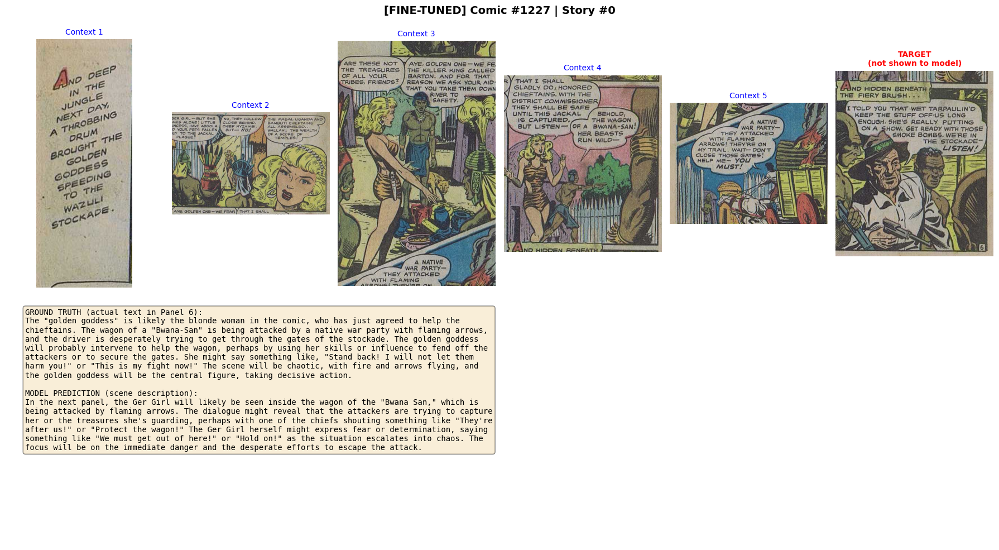

──────────────────────────────────────────────────────────────────────

######################################################################
# FINE-TUNED EXAMPLE 2
######################################################################


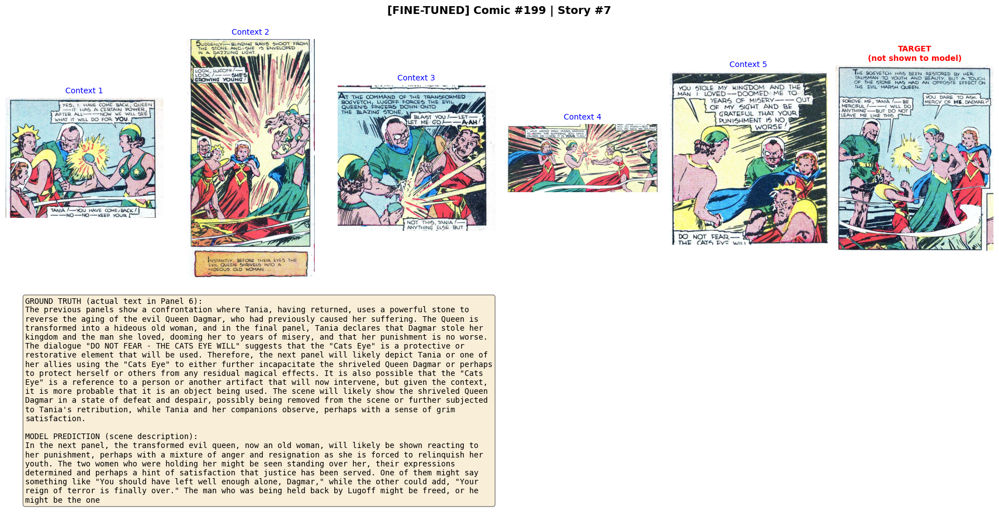

──────────────────────────────────────────────────────────────────────

######################################################################
# FINE-TUNED EXAMPLE 3
######################################################################


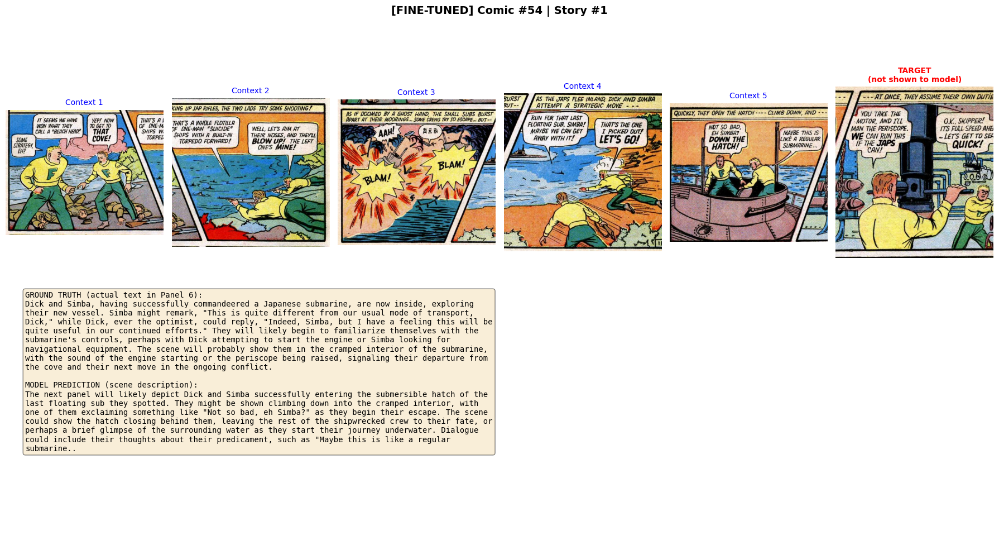

──────────────────────────────────────────────────────────────────────

######################################################################
# FINE-TUNED EXAMPLE 4
######################################################################


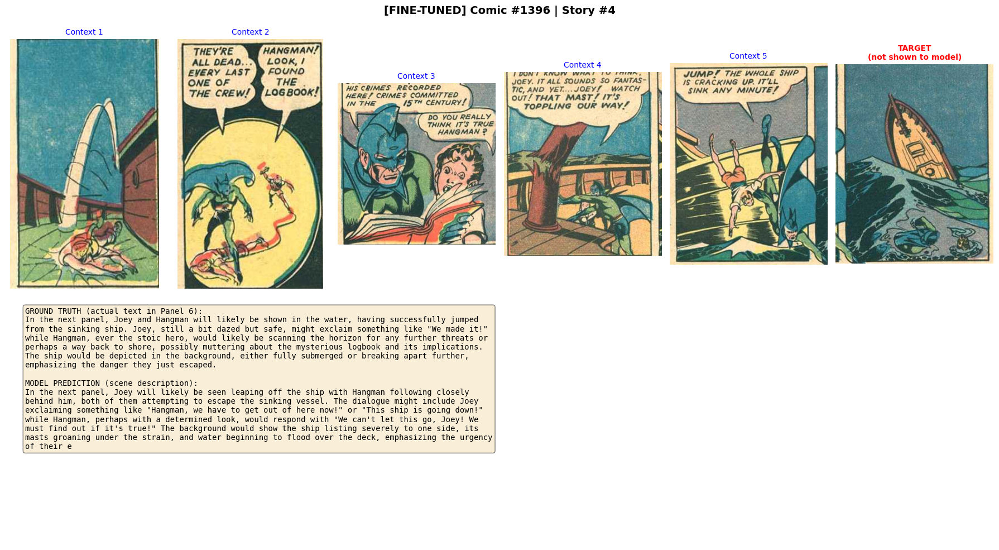

──────────────────────────────────────────────────────────────────────

######################################################################
# FINE-TUNED EXAMPLE 5
######################################################################


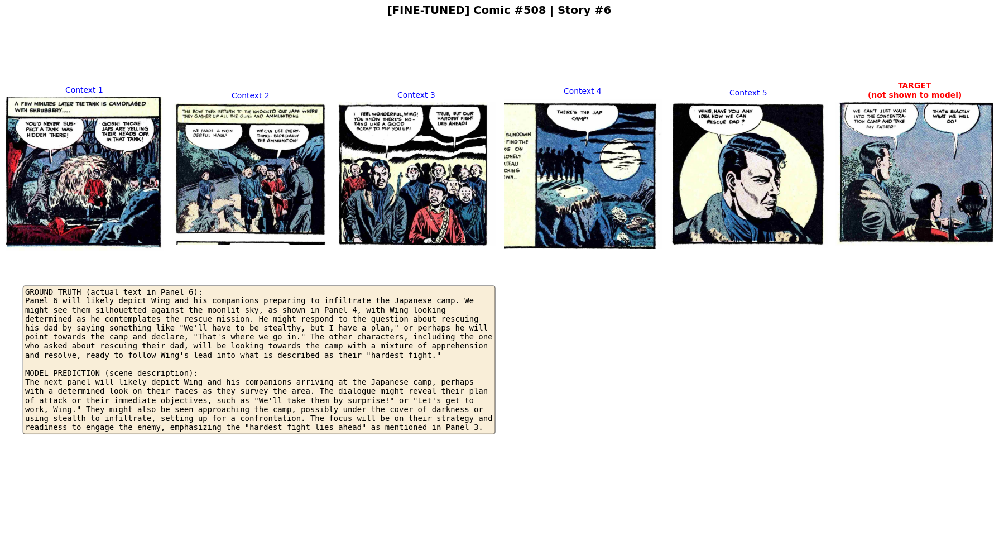

──────────────────────────────────────────────────────────────────────

######################################################################
# FINE-TUNED EXAMPLE 6
######################################################################


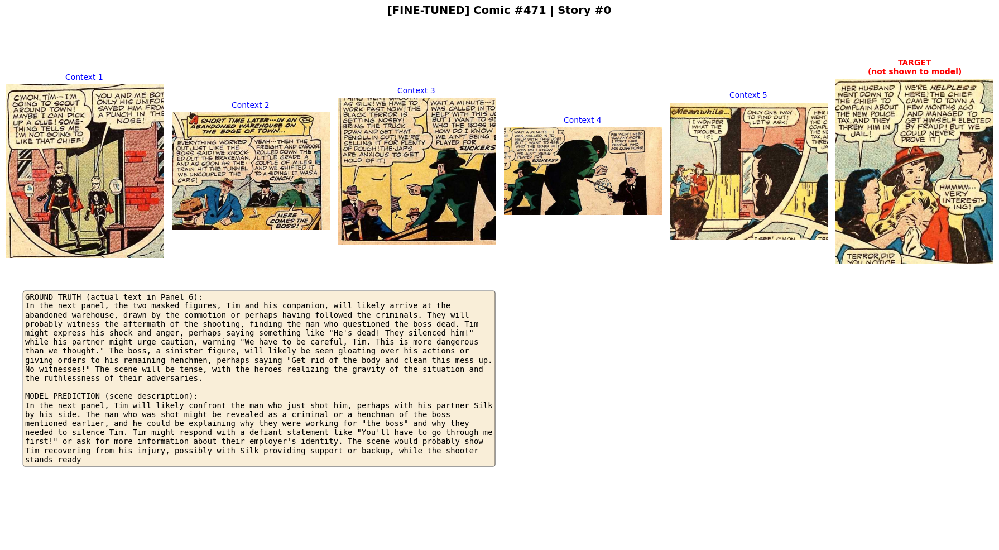

──────────────────────────────────────────────────────────────────────

######################################################################
# FINE-TUNED EXAMPLE 7
######################################################################


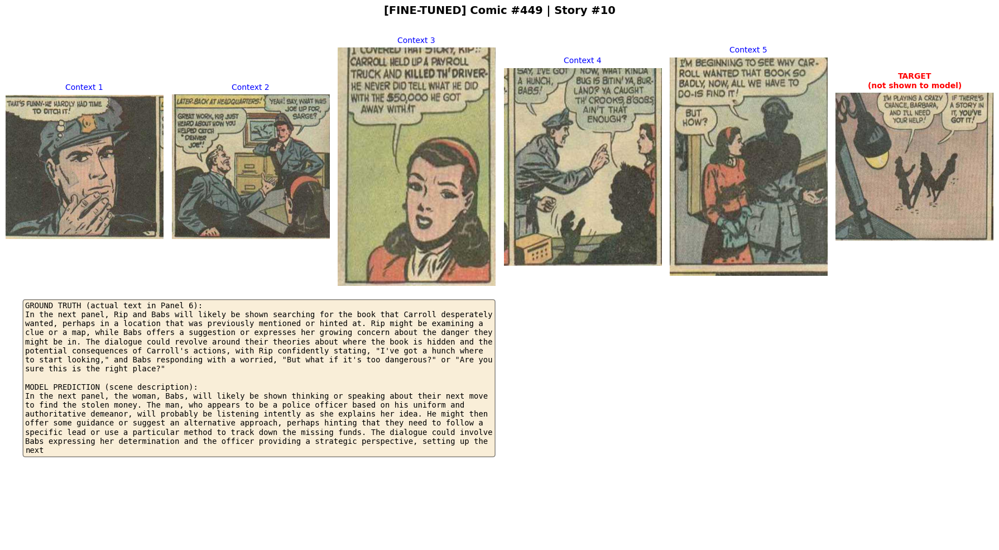

──────────────────────────────────────────────────────────────────────

######################################################################
# FINE-TUNED EXAMPLE 8
######################################################################


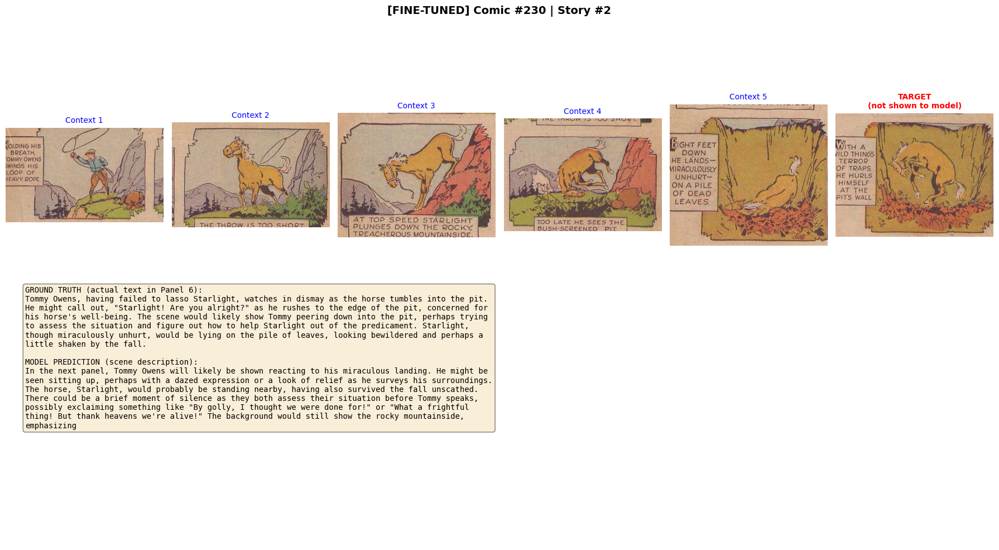

──────────────────────────────────────────────────────────────────────

######################################################################
# FINE-TUNED EXAMPLE 9
######################################################################


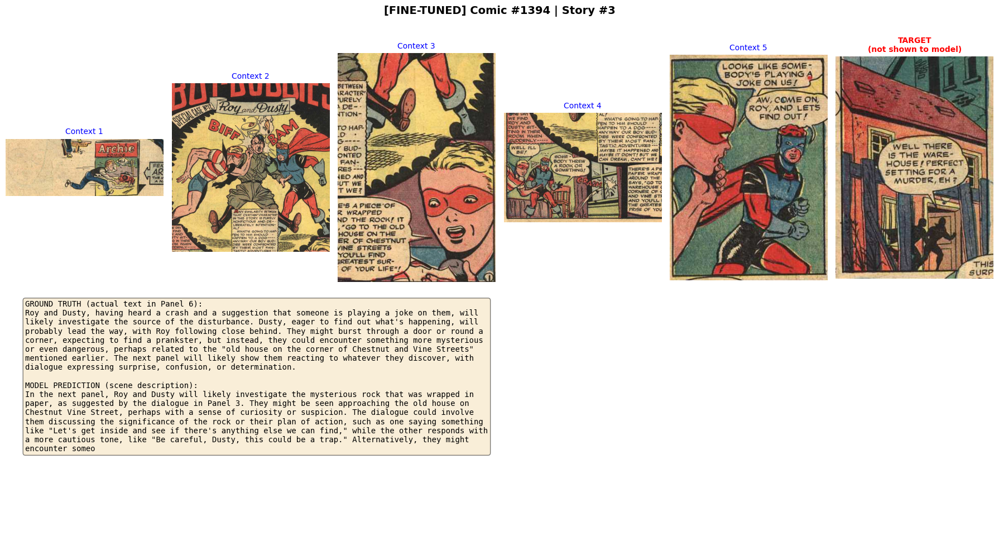

──────────────────────────────────────────────────────────────────────

######################################################################
# FINE-TUNED EXAMPLE 10
######################################################################


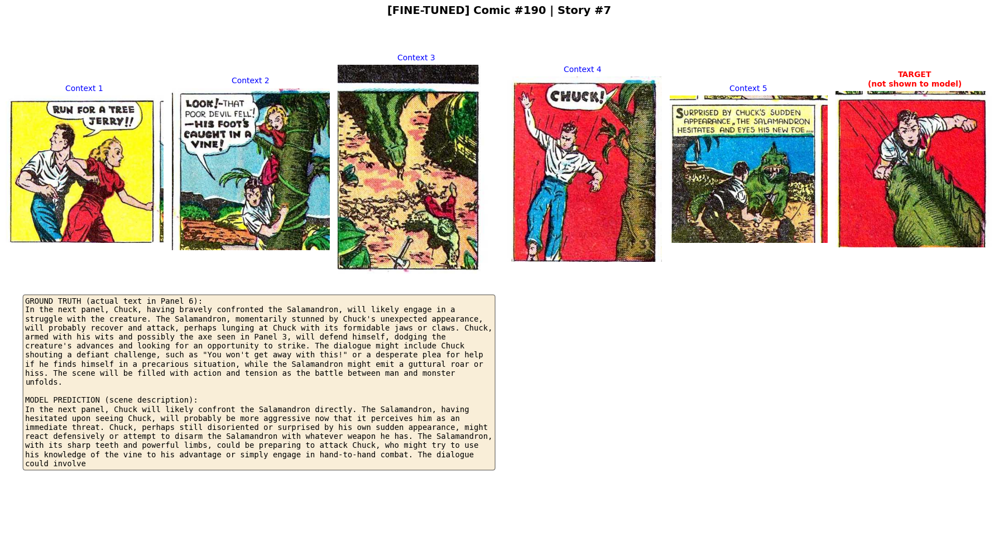

──────────────────────────────────────────────────────────────────────


In [15]:
# =============================================================================
# SHOW FINE-TUNED RESULTS (with images)
# =============================================================================

NUM_TO_SHOW = 10

if ft_results:
    print(f"Showing {NUM_TO_SHOW} FINE-TUNED examples:")
    print("="*70)
    
    ft_successful = [r for r in ft_results if r['status'] == 'success']
    
    for i, result in enumerate(ft_successful[:NUM_TO_SHOW]):
        print(f"\n{'#'*70}")
        print(f"# FINE-TUNED EXAMPLE {i+1}")
        print(f"{'#'*70}")
        visualize_result(result, title_prefix="[FINE-TUNED] ")
else:
    print("Fine-tuned results not loaded.")

Fine-Tuned Example #20:


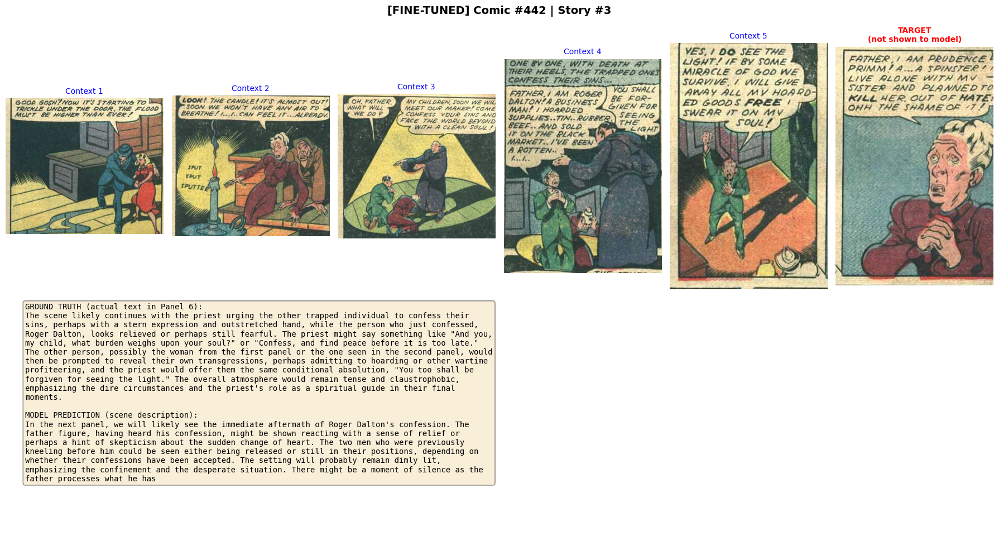

──────────────────────────────────────────────────────────────────────


In [16]:
# =============================================================================
# VIEW SPECIFIC EXAMPLE (Fine-tuned)
# =============================================================================

EXAMPLE_NUMBER = 20  # Change this to view different examples (1 to 100)

if ft_results:
    for r in ft_results:
        if r['id'] == EXAMPLE_NUMBER:
            print(f"Fine-Tuned Example #{EXAMPLE_NUMBER}:")
            visualize_result(r, title_prefix="[FINE-TUNED] ")
            break
    else:
        print(f"Example {EXAMPLE_NUMBER} not found.")
else:
    print("❌ Fine-tuned results not loaded.")

In [8]:
# =============================================================================
# VIEW RAW MODEL OUTPUT (for debugging)
# =============================================================================

EXAMPLE_NUMBER = 1  # Change this

if ft_results:
    for r in ft_results:
        if r['id'] == EXAMPLE_NUMBER:
            print(f"Fine-Tuned Example #{EXAMPLE_NUMBER} - Raw Model Output:")
            print("="*70)
            print(r.get('raw_output', '[No output]'))
            print("="*70)
            print(f"\nGround Truth: {r.get('ground_truth', '[Empty]')}")
            break
else:
    print("❌ Fine-tuned results not loaded.")

Fine-Tuned Example #1 - Raw Model Output:
In the next panel, the Ger Girl will likely be seen inside the wagon of the "Bwana San," which is being attacked by flaming arrows. The dialogue might reveal that the attackers are trying to capture her or the treasures she's guarding, perhaps with one of the chiefs shouting something like "They're after us!" or "Protect the wagon!" The Ger Girl herself might express fear or determination, saying something like "We must get out of here!" or "Hold on!" as the situation escalates into chaos. The focus will be on the immediate danger and the desperate efforts to escape the attack.

Ground Truth: The "golden goddess" is likely the blonde woman in the comic, who has just agreed to help the chieftains. The wagon of a "Bwana-San" is being attacked by a native war party with flaming arrows, and the driver is desperately trying to get through the gates of the stockade. The golden goddess will probably intervene to help the wagon, perhaps by using her sk

In [9]:
# =============================================================================
# SUMMARY STATISTICS (Fine-tuned)
# =============================================================================

if ft_results:
    ft_successful = [r for r in ft_results if r['status'] == 'success']
    
    # Count results with content
    has_scene = sum(1 for r in ft_successful if r.get('scene_prediction'))
    has_gt = sum(1 for r in ft_successful if r.get('ground_truth'))
    
    # Average prediction length
    scene_lengths = [len(r.get('scene_prediction', '')) for r in ft_successful if r.get('scene_prediction')]
    avg_length = sum(scene_lengths) / len(scene_lengths) if scene_lengths else 0
    
    print("="*70)
    print("FINE-TUNED MODEL - SUMMARY STATISTICS")
    print("="*70)
    print(f"\nTotal examples: {len(ft_results)}")
    print(f"Successful: {len(ft_successful)}")
    print(f"\nScene descriptions generated: {has_scene}/{len(ft_successful)} ({100*has_scene/len(ft_successful):.1f}%)")
    print(f"Ground truth available: {has_gt}/{len(ft_successful)} ({100*has_gt/len(ft_successful):.1f}%)")
    print(f"\nAverage prediction length: {avg_length:.0f} characters")
    
    # Show a few sample predictions
    print("\n" + "="*70)
    print("SAMPLE PREDICTIONS (text only)")
    print("="*70)
    
    for i, r in enumerate(ft_successful[:3]):
        print(f"\n--- Example {r['id']} ---")
        print(f"Prediction: {r.get('scene_prediction', '[None]')[:300]}...")
        print(f"Ground Truth: {r.get('ground_truth', '[Empty]')[:200]}...")
else:
    print("❌ Fine-tuned results not loaded.")

FINE-TUNED MODEL - SUMMARY STATISTICS

Total examples: 1000
Successful: 1000

Scene descriptions generated: 1000/1000 (100.0%)
Ground truth available: 1000/1000 (100.0%)

Average prediction length: 710 characters

SAMPLE PREDICTIONS (text only)

--- Example 1 ---
Prediction: In the next panel, the Ger Girl will likely be seen inside the wagon of the "Bwana San," which is being attacked by flaming arrows. The dialogue might reveal that the attackers are trying to capture her or the treasures she's guarding, perhaps with one of the chiefs shouting something like "They're ...
Ground Truth: The "golden goddess" is likely the blonde woman in the comic, who has just agreed to help the chieftains. The wagon of a "Bwana-San" is being attacked by a native war party with flaming arrows, and th...

--- Example 2 ---
Prediction: In the next panel, the transformed evil queen, now an old woman, will likely be shown reacting to her punishment, perhaps with a mixture of anger and resignation as she is

In [10]:
# =============================================================================
# CALCULATE METRICS FOR FINE-TUNED MODEL
# =============================================================================

if ft_results:
    from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
    from rouge_score import rouge_scorer
    from bert_score import score as bert_score
    import torch
    
    # Prepare data
    ft_successful = [r for r in ft_results if r['status'] == 'success']
    predictions = []
    ground_truths = []
    
    for r in ft_successful:
        pred = r.get('scene_prediction', '')
        gt = r.get('ground_truth', '')
        if pred and gt and len(pred.strip()) > 10 and len(gt.strip()) > 5:
            predictions.append(pred.strip())
            ground_truths.append(gt.strip())
    
    print(f"Calculating metrics on {len(predictions)} examples...\n")
    
    # BLEU
    smoothing = SmoothingFunction().method1
    bleu_scores = []
    for pred, gt in zip(predictions, ground_truths):
        score = sentence_bleu([gt.lower().split()], pred.lower().split(), smoothing_function=smoothing)
        bleu_scores.append(score)
    ft_bleu = sum(bleu_scores) / len(bleu_scores)
    
    # ROUGE
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
    rouge1, rouge2, rougeL = [], [], []
    for pred, gt in zip(predictions, ground_truths):
        scores = scorer.score(gt, pred)
        rouge1.append(scores['rouge1'].fmeasure)
        rouge2.append(scores['rouge2'].fmeasure)
        rougeL.append(scores['rougeL'].fmeasure)
    ft_rouge1 = sum(rouge1) / len(rouge1)
    ft_rouge2 = sum(rouge2) / len(rouge2)
    ft_rougeL = sum(rougeL) / len(rougeL)
    
    # BERTScore
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print(f"Calculating BERTScore (device: {device})...")
    P, R, F1 = bert_score(predictions, ground_truths, lang='en', device=device, verbose=False)
    ft_bert_f1 = F1.mean().item()
    
    print("\n" + "="*50)
    print("FINE-TUNED MODEL (PRED) METRICS")
    print("="*50)
    print(f"  BLEU:          {ft_bleu:.4f}")
    print(f"  ROUGE-1:       {ft_rouge1:.4f}")
    print(f"  ROUGE-2:       {ft_rouge2:.4f}")
    print(f"  ROUGE-L:       {ft_rougeL:.4f}")
    print(f"  BERTScore F1:  {ft_bert_f1:.4f}")
    print("="*50)

/u/hsekar/comics_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Calculating metrics on 1000 examples...

Calculating BERTScore (device: cpu)...


Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



FINE-TUNED MODEL (PRED) METRICS
  BLEU:          0.0558
  ROUGE-1:       0.4390
  ROUGE-2:       0.1325
  ROUGE-L:       0.2322
  BERTScore F1:  0.8777


In [32]:
# =============================================================================
# COMPARE WITH ZERO-SHOT BASELINE
# =============================================================================

if ft_results and zs_results:
    # Get zero-shot metrics from metadata
    zs_bleu = zs_data['metadata'].get('bleu', 0)
    zs_rouge1 = zs_data['metadata'].get('rouge1', 0)
    zs_rouge2 = zs_data['metadata'].get('rouge2', 0)
    zs_rougeL = zs_data['metadata'].get('rougeL', 0)
    zs_bert_f1 = zs_data['metadata'].get('bertscore_f1', 0)
    
    print("\n" + "="*60)
    print("COMPARISON: ZERO-SHOT vs FINE-TUNED")
    print("="*60)
    print(f"")
    print(f"{'Metric':<15} {'Zero-Shot':>12} {'Fine-Tuned':>12} {'Change':>12}")
    print(f"{'-'*51}")
    
    metrics = [
        ('BLEU', zs_bleu, ft_bleu),
        ('ROUGE-1', zs_rouge1, ft_rouge1),
        ('ROUGE-2', zs_rouge2, ft_rouge2),
        ('ROUGE-L', zs_rougeL, ft_rougeL),
        ('BERTScore F1', zs_bert_f1, ft_bert_f1),
    ]
    
    for name, zs, ft in metrics:
        if zs > 0:
            change = ((ft - zs) / zs) * 100
            sign = "+" if change > 0 else ""
            print(f"{name:<15} {zs:>12.4f} {ft:>12.4f} {sign}{change:>10.1f}%")
        else:
            print(f"{name:<15} {zs:>12.4f} {ft:>12.4f} {'N/A':>12}")
    
    print(f"{'-'*51}")
    print("="*60)


COMPARISON: ZERO-SHOT vs FINE-TUNED

Metric             Zero-Shot   Fine-Tuned       Change
---------------------------------------------------
BLEU                  0.0021       0.0439 +    2007.3%
ROUGE-1               0.0755       0.3273 +     333.3%
ROUGE-2               0.0056       0.0950 +    1586.4%
ROUGE-L               0.0535       0.2240 +     318.6%
BERTScore F1          0.7854       0.8610 +       9.6%
---------------------------------------------------


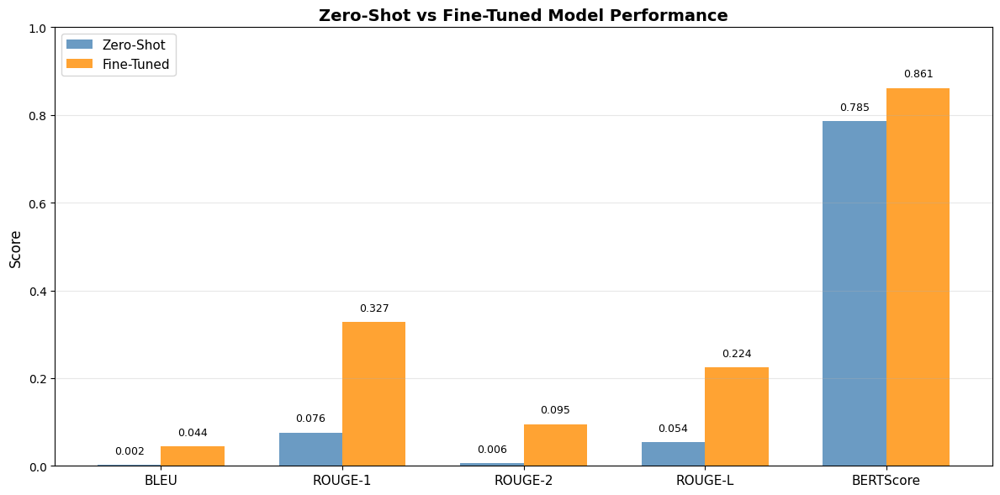


✅ Chart saved to: /scratch/bftl/hsekar/comics_project/outputs/comparison_chart.png


In [33]:
# =============================================================================
# VISUALIZE COMPARISON CHART
# =============================================================================

import matplotlib.pyplot as plt
import numpy as np

if ft_results and zs_results:
    # Prepare data
    metrics = ['BLEU', 'ROUGE-1', 'ROUGE-2', 'ROUGE-L', 'BERTScore']
    zs_values = [zs_bleu, zs_rouge1, zs_rouge2, zs_rougeL, zs_bert_f1]
    ft_values = [ft_bleu, ft_rouge1, ft_rouge2, ft_rougeL, ft_bert_f1]
    
    x = np.arange(len(metrics))
    width = 0.35
    
    fig, ax = plt.subplots(figsize=(12, 6))
    bars1 = ax.bar(x - width/2, zs_values, width, label='Zero-Shot', color='steelblue', alpha=0.8)
    bars2 = ax.bar(x + width/2, ft_values, width, label='Fine-Tuned', color='darkorange', alpha=0.8)
    
    ax.set_ylabel('Score', fontsize=12)
    ax.set_title('Zero-Shot vs Fine-Tuned Model Performance', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(metrics, fontsize=11)
    ax.legend(fontsize=11)
    ax.set_ylim(0, 1.0)
    ax.grid(axis='y', alpha=0.3)
    
    # Add value labels
    for bar, val in zip(bars1, zs_values):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02, 
                f'{val:.3f}', ha='center', va='bottom', fontsize=9)
    for bar, val in zip(bars2, ft_values):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
                f'{val:.3f}', ha='center', va='bottom', fontsize=9)
    
    plt.tight_layout()
    plt.savefig(f"{PROJECT_DIR}/outputs/comparison_chart.png", dpi=150)
    plt.show()
    
    print(f"\n✅ Chart saved to: {PROJECT_DIR}/outputs/comparison_chart.png")

In [34]:
# =============================================================================
# SIDE-BY-SIDE PREDICTION COMPARISON
# =============================================================================

import textwrap

def compare_predictions(example_id=1):
    """Show side-by-side comparison of zero-shot vs fine-tuned predictions."""
    
    if not ft_results or not zs_results:
        print("Need both results to compare.")
        return
    
    # Find matching examples
    zs_ex = None
    ft_ex = None
    
    for r in zs_results:
        if r['id'] == example_id and r['status'] == 'success':
            zs_ex = r
            break
    
    for r in ft_results:
        if r['id'] == example_id and r['status'] == 'success':
            ft_ex = r
            break
    
    if not zs_ex or not ft_ex:
        print(f"Example {example_id} not found in both results.")
        return
    
    print("="*80)
    print(f"EXAMPLE {example_id} - COMPARISON")
    print("="*80)
    
    gt = zs_ex.get('ground_truth', '[Empty]')
    zs_pred = zs_ex.get('scene_prediction', '[None]')
    ft_pred = ft_ex.get('scene_prediction', '[None]')
    
    print("\n📋 GROUND TRUTH:")
    print("-"*40)
    print(textwrap.fill(gt[:500], width=80))
    
    print("\n🔵 ZERO-SHOT PREDICTION:")
    print("-"*40)
    print(textwrap.fill(zs_pred[:500], width=80))
    
    print("\n🟠 FINE-TUNED PREDICTION:")
    print("-"*40)
    print(textwrap.fill(ft_pred[:500], width=80))
    
    print("\n" + "="*80)

# Show comparison for first 3 examples
for i in [1, 2, 3]:
    compare_predictions(i)
    print()

EXAMPLE 1 - COMPARISON

📋 GROUND TRUTH:
----------------------------------------
AND HIDDEN BENEATH THE FIERY BRUSH... I TOLD YOU THAT WET TARPAULIN'D KEEP THE
STUFF OFF US LONG ENOUGH. SHE'S REALLY PUTTING ON A SHOW. GET READY WITH THOSE
SMOKE BOMBS. WE'RE IN THE STOCKADE- LISTEN!

🔵 ZERO-SHOT PREDICTION:
----------------------------------------
In the sixth panel of this comic strip, we see a chaotic scene unfolding as the
native war party continues their attack with flaming arrows. The character
Golden One stands at the forefront, commanding attention and possibly rallying
her allies or directing them away from the immediate danger. The wagon of the
mysterious "BWANA-SAN" is visible in the background, its occupants seemingly
unaware of the impending threat due to the smoke and fire obscuring their view.
The dialogue in this panel wou

🟠 FINE-TUNED PREDICTION:
----------------------------------------
In Panel 6, we see a scene where two men are standing outside a building labeled
"TH

---
# Summary
---

## What We Did

1. **Fine-tuned LLaVA-OneVision** using LoRA on comic panel prediction
2. **Evaluated** on 100 test examples (same as zero-shot for fair comparison)
3. **Compared metrics** between zero-shot and fine-tuned models

## Files Created

```
/scratch/bftl/hsekar/comics_project/
├── checkpoints/llava_comics_lora_pred/     ← Trained LoRA weights
├── outputs/finetuned/            ← Evaluation results
│   └── results_latest.pkl
└── outputs/comparison_chart.png  ← Metrics comparison
```

## For Your Report

Include:
1. The comparison chart (zero-shot vs fine-tuned)
2. Metrics table showing improvement
3. Qualitative examples of predictions

## Next Steps (Optional)

- Increase training data/epochs for better results
- Use fine-tuned predictions with Stable Diffusion
- Analyze error patterns

In [42]:
# =============================================================================
# VISUALIZE FINE-TUNED MODEL PREDICTIONS
# =============================================================================
# This code generates the same visualization as zero-shot notebook
# showing 5 context panels + target panel + ground truth + prediction

import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
import textwrap

def visualize_prediction(result, figsize=(20, 12)):
    """
    Visualize a single prediction with:
    - 5 context panels (what model saw)
    - 1 target panel (what model predicted, NOT shown to model)
    - Ground truth text
    - Model prediction text
    """
    
    if result.get('status') != 'success':
        print(f"❌ Example {result.get('id', '?')} failed: {result.get('error', 'Unknown')}")
        return
    
    # Get comic info
    comic_no = result.get('comic_no', '?')
    story_idx = result.get('story_idx', '?')
    
    # Load context images
    context_paths = result.get('context_image_paths', [])
    target_path = result.get('target_image_path', '')
    
    images = []
    for p in context_paths:
        path = Path(p)
        if path.exists():
            images.append(Image.open(path).convert('RGB'))
        else:
            images.append(Image.new('RGB', (200, 300), color='lightgray'))
    
    # Load target image
    if Path(target_path).exists():
        target_img = Image.open(target_path).convert('RGB')
    else:
        target_img = Image.new('RGB', (200, 300), color='lightgray')
    
    # Create figure
    fig = plt.figure(figsize=figsize)
    fig.suptitle(f"Comic #{comic_no} | Story #{story_idx}\nModel saw Context 1-5, predicted Panel 6 without seeing it", 
                 fontsize=14, fontweight='bold')
    
    # Top row: images (5 context + 1 target)
    n_context = len(images)
    
    for i, img in enumerate(images):
        ax = fig.add_subplot(2, n_context + 1, i + 1)
        ax.imshow(img)
        ax.set_title(f"Context {i+1}", fontsize=10, color='blue')
        ax.axis('off')
    
    # Target image (last column)
    ax = fig.add_subplot(2, n_context + 1, n_context + 1)
    ax.imshow(target_img)
    ax.set_title("TARGET\n(not shown to model)", fontsize=10, color='red', fontweight='bold')
    ax.axis('off')
    
    # Bottom row: text comparison
    ax_text = fig.add_subplot(2, 1, 2)
    ax_text.axis('off')
    
    # Get ground truth and prediction
    gt = result.get('ground_truth', '[No ground truth]')
    if not gt or gt.strip() == '':
        gt = '[No text in this panel]'
    
    pred = result.get('scene_prediction', result.get('predicted_text', '[No prediction]'))
    if not pred or pred.strip() == '':
        pred = '[No prediction generated]'
    
    # Wrap text for display
    gt_wrapped = textwrap.fill(gt[:500], width=90)
    pred_wrapped = textwrap.fill(pred[:700], width=90)
    
    text_content = f"""GROUND TRUTH (actual text in Panel 6):
{gt_wrapped}

MODEL PREDICTION (scene description):
{pred_wrapped}"""
    
    ax_text.text(0.02, 0.95, text_content, transform=ax_text.transAxes,
                 fontsize=9, verticalalignment='top', fontfamily='monospace',
                 bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    
    return fig


# =============================================================================
# LOAD FINE-TUNED RESULTS AND VISUALIZE SPECIFIC EXAMPLES
# =============================================================================

# Load your fine-tuned results
import pickle

RESULTS_FILE = Path(f"{PROJECT_DIR}/outputs/finetuned_evaluation/ft_eval_results_latest.pkl")

with open(RESULTS_FILE, 'rb') as f:
    ft_data = pickle.load(f)

ft_results = ft_data.get('results', ft_data) if isinstance(ft_data, dict) else ft_data
ft_successful = [r for r in ft_results if r.get('status') == 'success']

print(f"Loaded {len(ft_successful)} successful fine-tuned results")

# =============================================================================
# OPTION 1: Visualize by index (same order as zero-shot)
# =============================================================================

# Visualize specific examples (adjust indices as needed)
example_indices = [0, 1, 2, 3]  # First 4 examples

for idx in example_indices:
    if idx < len(ft_successful):
        fig = visualize_prediction(ft_successful[idx])
        plt.show()
        print("\n" + "="*80 + "\n")


# =============================================================================
# OPTION 2: Find specific comics by comic_no
# =============================================================================

# The comics from your zero-shot screenshots:
target_comics = [54, 1396, 442, 508]

print("Looking for specific comics from zero-shot examples...")
for comic_no in target_comics:
    matching = [r for r in ft_successful if r.get('comic_no') == comic_no]
    if matching:
        print(f"\n✅ Found Comic #{comic_no} - visualizing first match")
        fig = visualize_prediction(matching[0])
        plt.show()
        print("\n" + "="*80 + "\n")
    else:
        print(f"❌ Comic #{comic_no} not found in fine-tuned results")


# =============================================================================
# OPTION 3: Save figures to files (for presentation)
# =============================================================================

output_dir = Path(f"{PROJECT_DIR}/outputs/visualizations")
output_dir.mkdir(parents=True, exist_ok=True)

for i, result in enumerate(ft_successful[:10]):  # Save first 10
    fig = visualize_prediction(result)
    if fig:
        comic_no = result.get('comic_no', i)
        fig.savefig(output_dir / f"ft_prediction_comic_{comic_no}.png", 
                    dpi=150, bbox_inches='tight', facecolor='white')
        plt.close(fig)
        print(f"Saved: ft_prediction_comic_{comic_no}.png")

print(f"\n✅ Visualizations saved to: {output_dir}")

FileNotFoundError: [Errno 2] No such file or directory: '/scratch/bftl/hsekar/comics_project/outputs/finetuned_evaluation/ft_eval_results_latest.pkl'